

# Assignment Data Science DAI-101
## Real-world Dataset Analysis using Data Science

---


#### Name: Divyesh Bansal
#### Branch: Computer Science and Engineering 




---

##### Chosen dataset - Student Performance Factors

Source: https://www.kaggle.com/datasets/lainguyn123/student-performance-factors

---

##### Importing all necessary libraries in the beginning.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score, validation_curve
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer

  

import warnings
warnings.filterwarnings("ignore")

# Importing dataset and performing data cleaning

In [2]:
file =("StudentPerformanceFactors.csv")
df = pd.read_csv(file) 

In [3]:
df.head(10)

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70
5,19,88,Medium,Medium,Yes,8,89,Medium,Yes,3,Medium,Medium,Public,Positive,3,No,Postgraduate,Near,Male,71
6,29,84,Medium,Low,Yes,7,68,Low,Yes,1,Low,Medium,Private,Neutral,2,No,High School,Moderate,Male,67
7,25,78,Low,High,Yes,6,50,Medium,Yes,1,High,High,Public,Negative,2,No,High School,Far,Male,66
8,17,94,Medium,High,No,6,80,High,Yes,0,Medium,Low,Private,Neutral,1,No,College,Near,Male,69
9,23,98,Medium,Medium,Yes,8,71,Medium,Yes,0,High,High,Public,Positive,5,No,High School,Moderate,Male,72


In [4]:
df.describe()

,Hours_Studied,Attendance,Sleep_Hours,Previous_Scores,Tutoring_Sessions,Physical_Activity,Exam_Score
count,6607.000000,6607.000000,6607.00000,6607.000000,6607.000000,6607.000000,6607.000000
mean,19.975329,79.977448,7.02906,75.070531,1.493719,2.967610,67.235659
std,5.990594,11.547475,1.46812,14.399784,1.230570,1.031231,3.890456
min,1.000000,60.000000,4.00000,50.000000,0.000000,0.000000,55.000000
25%,16.000000,70.000000,6.00000,63.000000,1.000000,2.000000,65.000000
50%,20.000000,80.000000,7.00000,75.000000,1.000000,3.000000,67.000000
75%,24.000000,90.000000,8.00000,88.000000,2.000000,4.000000,69.000000
max,44.000000,100.000000,10.00000,100.000000,8.000000,6.000000,101.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6607 entries, 0 to 6606
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Hours_Studied               6607 non-null   int64 
 1   Attendance                  6607 non-null   int64 
 2   Parental_Involvement        6607 non-null   object
 3   Access_to_Resources         6607 non-null   object
 4   Extracurricular_Activities  6607 non-null   object
 5   Sleep_Hours                 6607 non-null   int64 
 6   Previous_Scores             6607 non-null   int64 
 7   Motivation_Level            6607 non-null   object
 8   Internet_Access             6607 non-null   object
 9   Tutoring_Sessions           6607 non-null   int64 
 10  Family_Income               6607 non-null   object
 11  Teacher_Quality             6529 non-null   object
 12  School_Type                 6607 non-null   object
 13  Peer_Influence              6607 non-null   obje

In [6]:
df.isna().sum()

Hours_Studied                  0
Attendance                     0
Parental_Involvement           0
Access_to_Resources            0
Extracurricular_Activities     0
Sleep_Hours                    0
Previous_Scores                0
Motivation_Level               0
Internet_Access                0
Tutoring_Sessions              0
Family_Income                  0
Teacher_Quality               78
School_Type                    0
Peer_Influence                 0
Physical_Activity              0
Learning_Disabilities          0
Parental_Education_Level      90
Distance_from_Home            67
Gender                         0
Exam_Score                     0
dtype: int64

---

There are null entries in a few categorical columns. We can impute them by replacing the null values with the most frequent value of that column.

In [7]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns
cat_cols = df.select_dtypes(include=['object']).columns

df[num_cols] = SimpleImputer(strategy='mean').fit_transform(df[num_cols])

df[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(df[cat_cols])

---

# Exploratory Data Analysis

First, let's look at the distributions of all the features in our dataset.

## UNIVARIATE ANALYSIS

In [8]:
summary_stats = df.describe(include='all')
print("Summary Statistics:\n", summary_stats)

Summary Statistics:
         Hours_Studied   Attendance Parental_Involvement Access_to_Resources  \
count     6607.000000  6607.000000                 6607                6607   
unique            NaN          NaN                    3                   3   
top               NaN          NaN               Medium              Medium   
freq              NaN          NaN                 3362                3319   
mean        19.975329    79.977448                  NaN                 NaN   
std          5.990594    11.547475                  NaN                 NaN   
min          1.000000    60.000000                  NaN                 NaN   
25%         16.000000    70.000000                  NaN                 NaN   
50%         20.000000    80.000000                  NaN                 NaN   
75%         24.000000    90.000000                  NaN                 NaN   
max         44.000000   100.000000                  NaN                 NaN   

       Extracurricular_Activit

In [9]:
numerical_columns = df.select_dtypes(include=['number']).columns
skewness = df[numerical_columns].skew()
print("\nSkewness:\n",skewness)



Skewness:
 Hours_Studied        0.013499
Attendance           0.013666
Sleep_Hours         -0.023805
Previous_Scores     -0.003737
Tutoring_Sessions    0.815530
Physical_Activity   -0.031365
Exam_Score           1.644808
dtype: float64


#### Frequency distribution for categorical variables

In [10]:
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"\nFrequency distribution for {col}:\n")
    print(df[col].value_counts())


Frequency distribution for Parental_Involvement:

Parental_Involvement
Medium    3362
High      1908
Low       1337
Name: count, dtype: int64

Frequency distribution for Access_to_Resources:

Access_to_Resources
Medium    3319
High      1975
Low       1313
Name: count, dtype: int64

Frequency distribution for Extracurricular_Activities:

Extracurricular_Activities
Yes    3938
No     2669
Name: count, dtype: int64

Frequency distribution for Motivation_Level:

Motivation_Level
Medium    3351
Low       1937
High      1319
Name: count, dtype: int64

Frequency distribution for Internet_Access:

Internet_Access
Yes    6108
No      499
Name: count, dtype: int64

Frequency distribution for Family_Income:

Family_Income
Low       2672
Medium    2666
High      1269
Name: count, dtype: int64

Frequency distribution for Teacher_Quality:

Teacher_Quality
Medium    4003
High      1947
Low        657
Name: count, dtype: int64

Frequency distribution for School_Type:

School_Type
Public     4598
Pri

#### Histograms for numerical variables

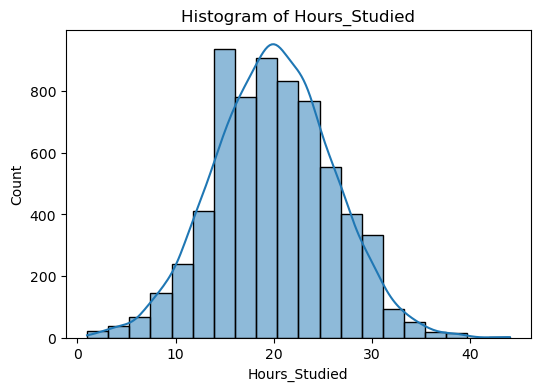

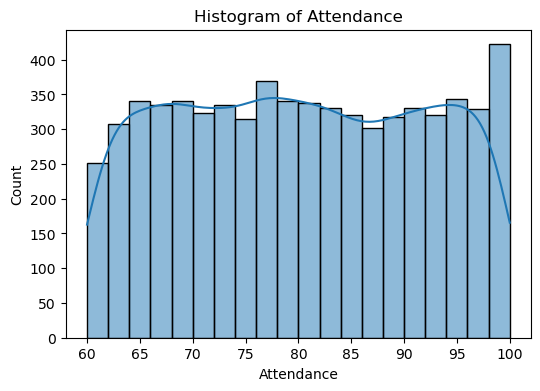

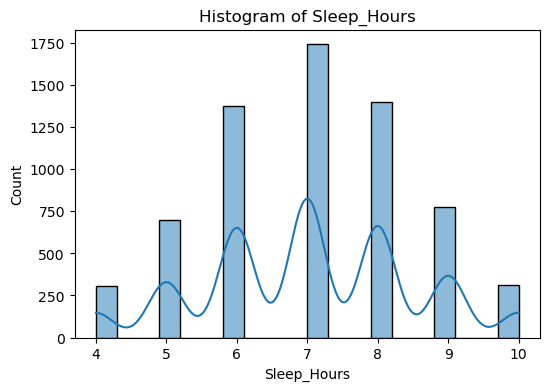

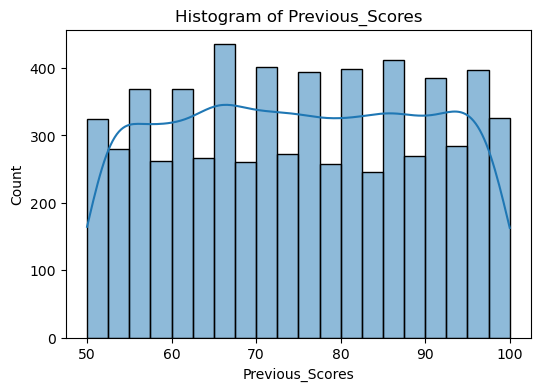

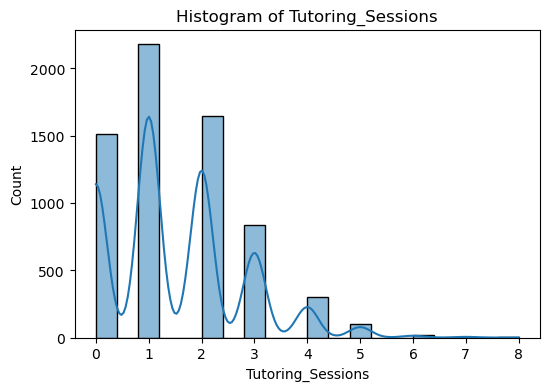

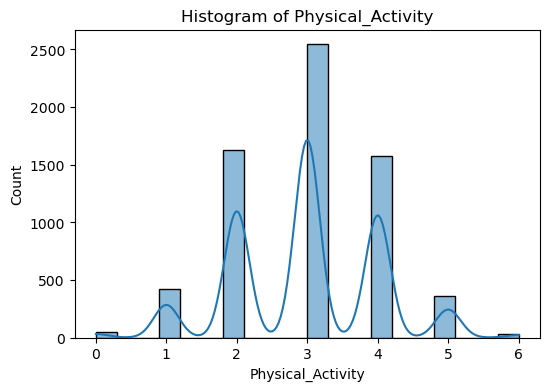

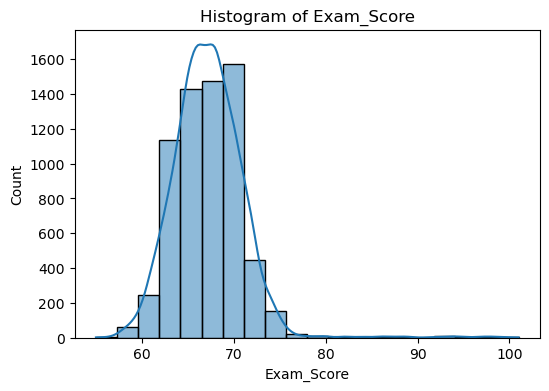

In [11]:
for col in numerical_columns:
    plt.figure(figsize=(6,4))
    sns.histplot(df[col].dropna(), kde=True, bins=20)
    plt.title(f"Histogram of {col}")
    plt.show()

#### Box plots for numerical variables

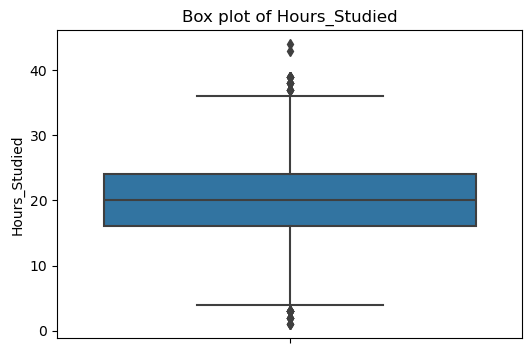

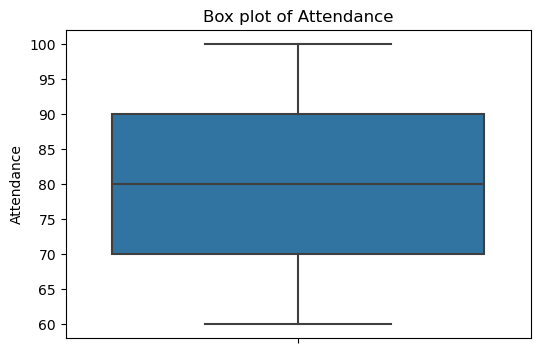

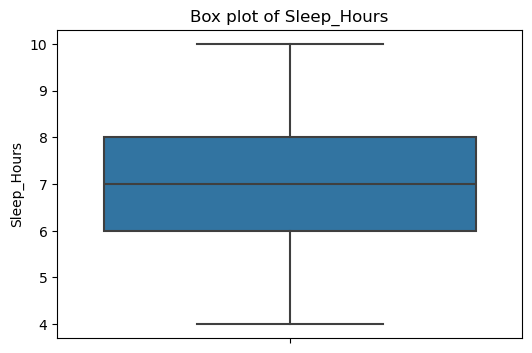

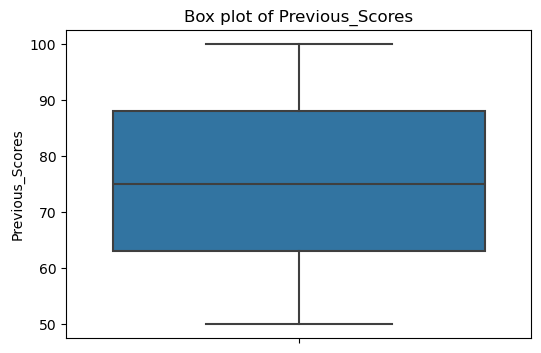

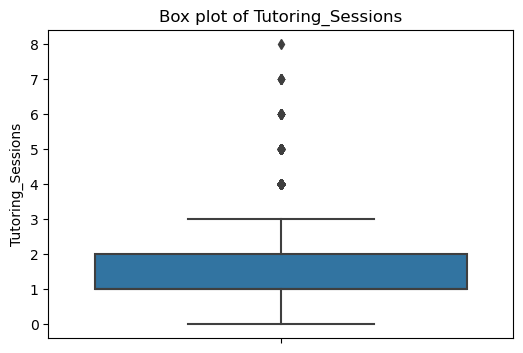

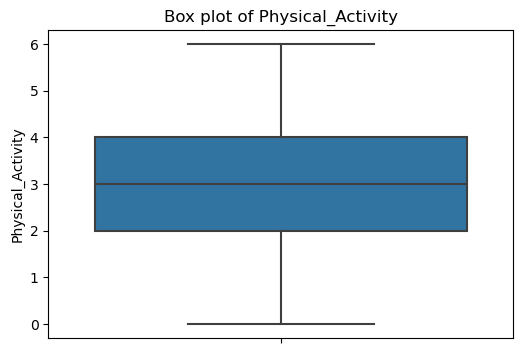

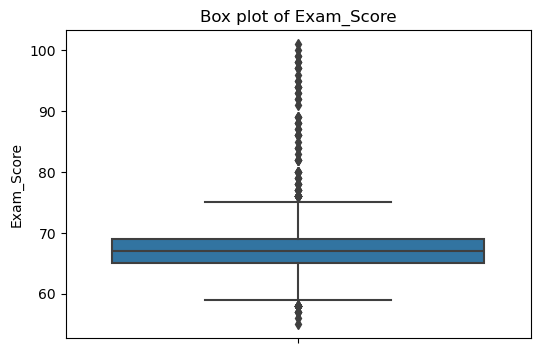

In [12]:
for col in numerical_columns:
    plt.figure(figsize=(6,4))
    sns.boxplot(y=df[col])
    plt.title(f"Box plot of {col}")
    plt.show()


## Bivariate Analysis

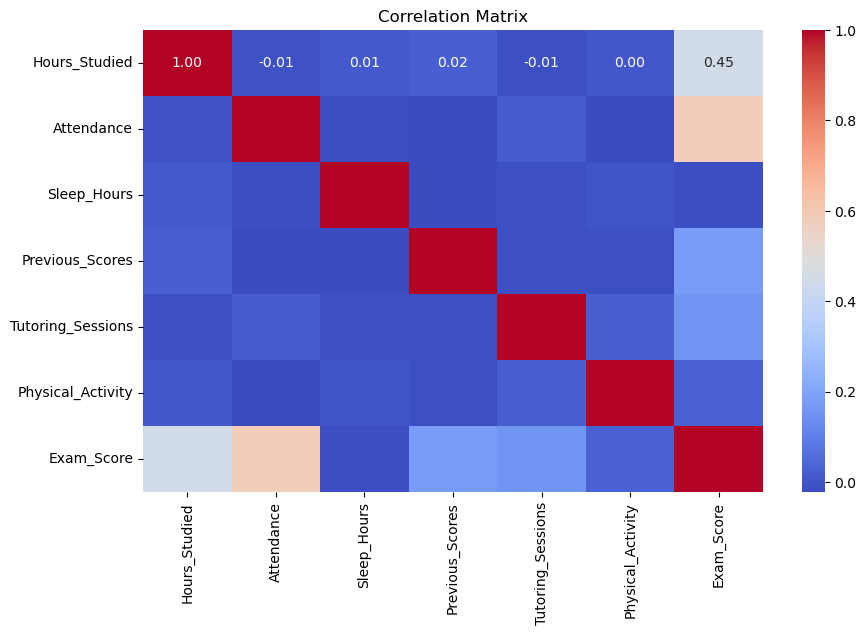

In [13]:
# Correlation Matrix
plt.figure(figsize=(10,6))
sns.heatmap(df[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

#### Scatter plots for continuous variable relationships

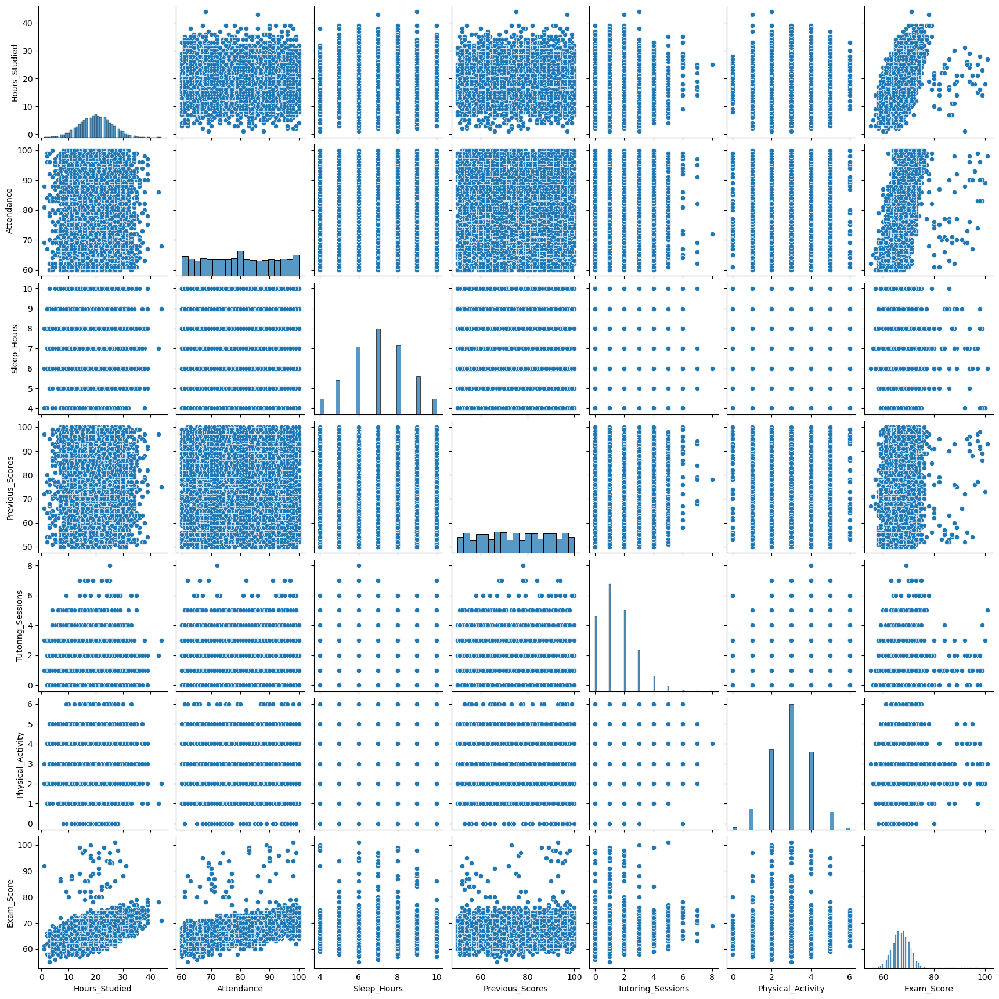

In [14]:

sns.pairplot(df[numerical_columns])
plt.show()

#### Box plots comparing categorical and numerical variables

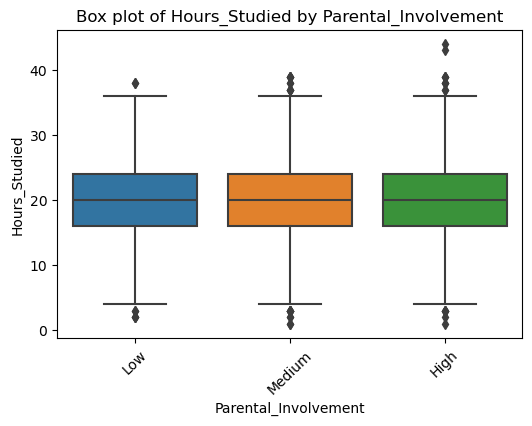

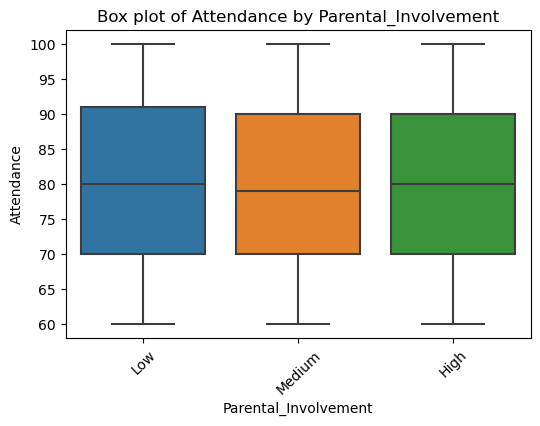

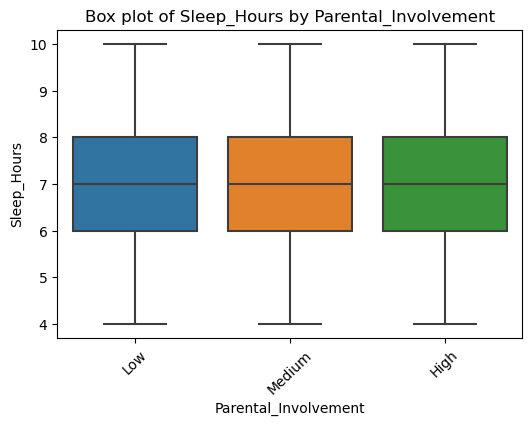

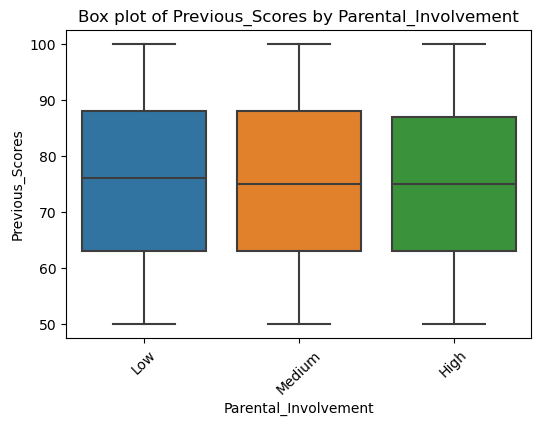

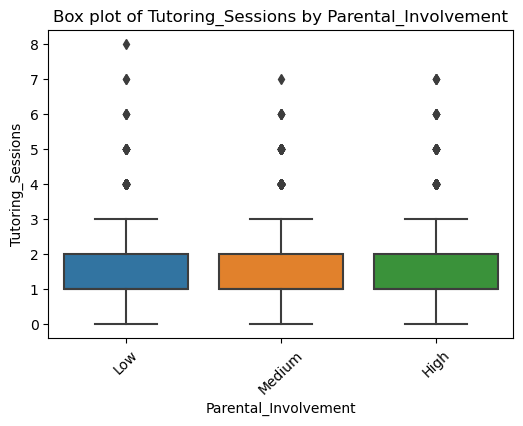

...

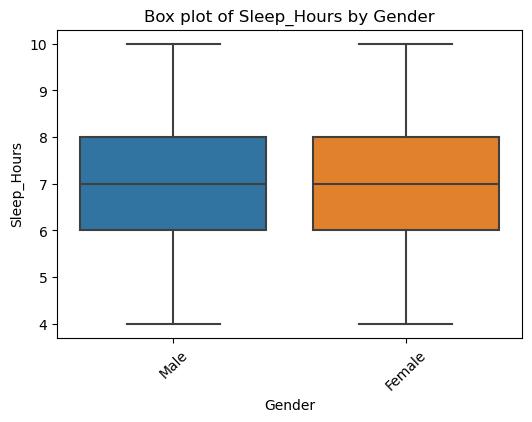

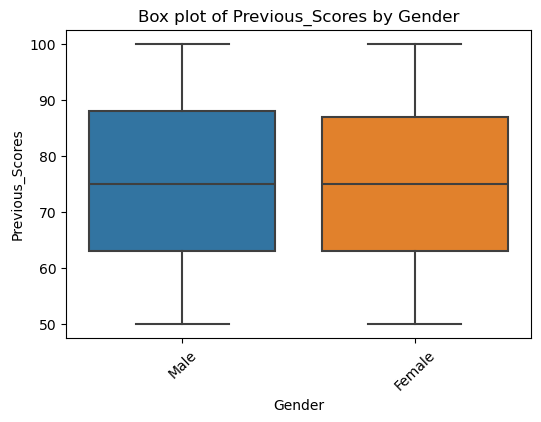

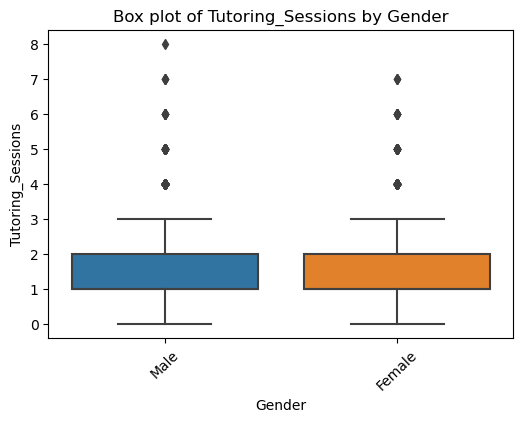

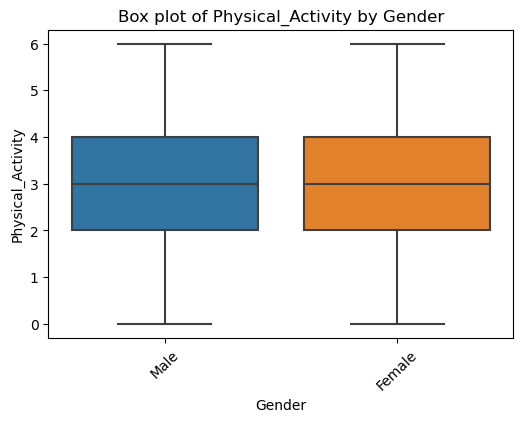

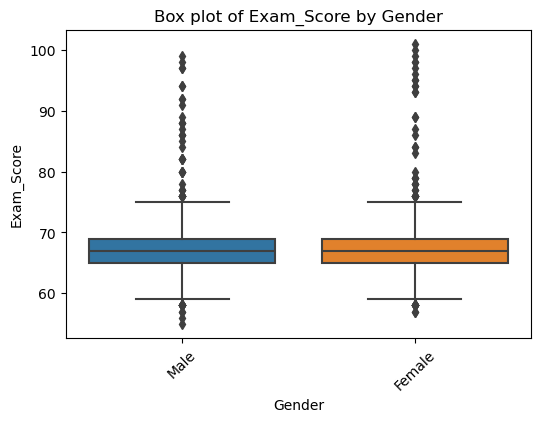

In [15]:

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(6,4))
        sns.boxplot(x=df[cat_col], y=df[num_col])
        plt.title(f"Box plot of {num_col} by {cat_col}")
        plt.xticks(rotation=44)
        plt.show()

#### Violin plots comparing categorical and numerical variables

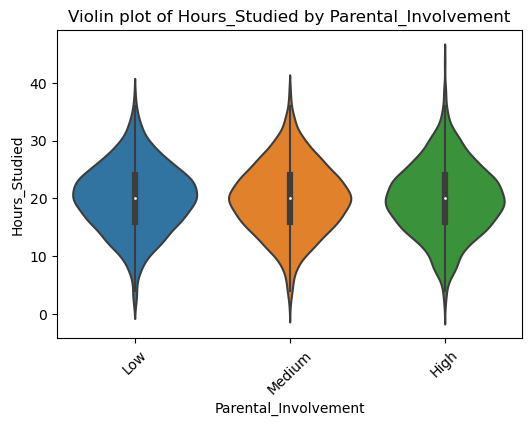

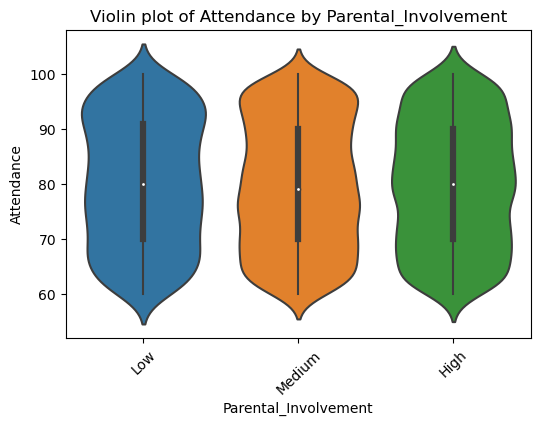

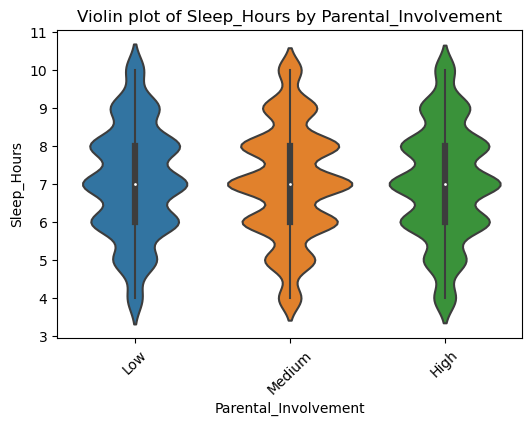

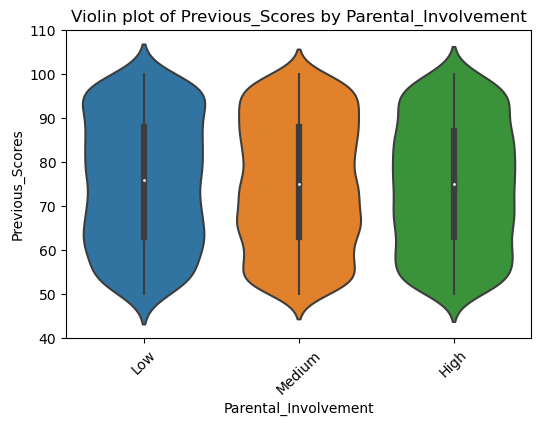

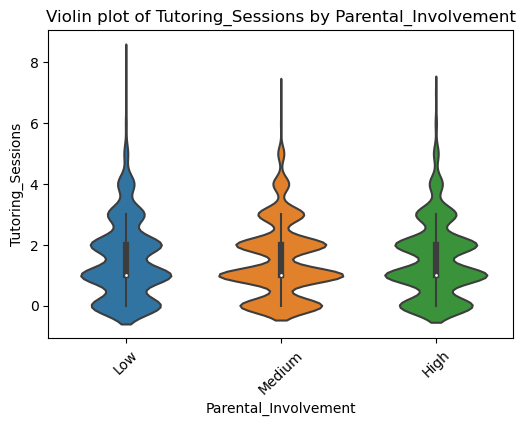

...

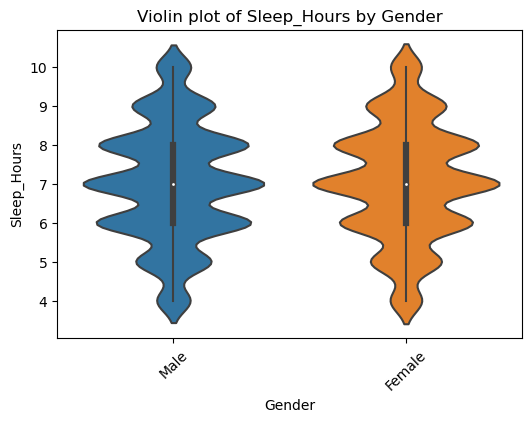

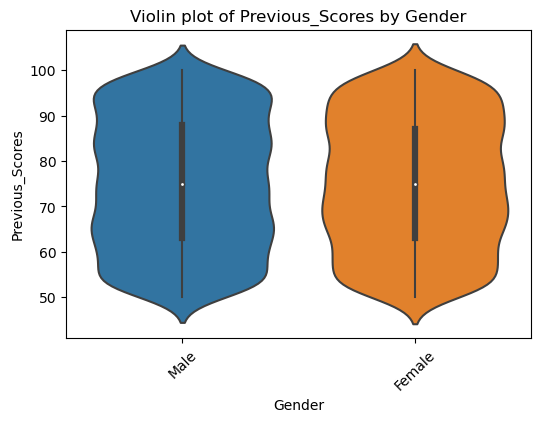

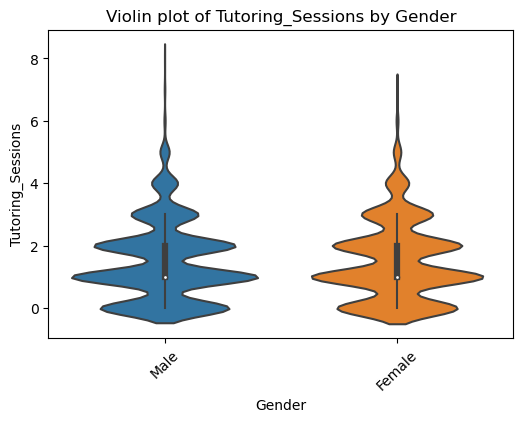

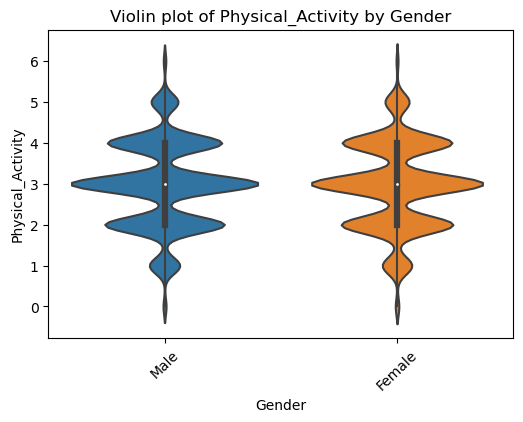

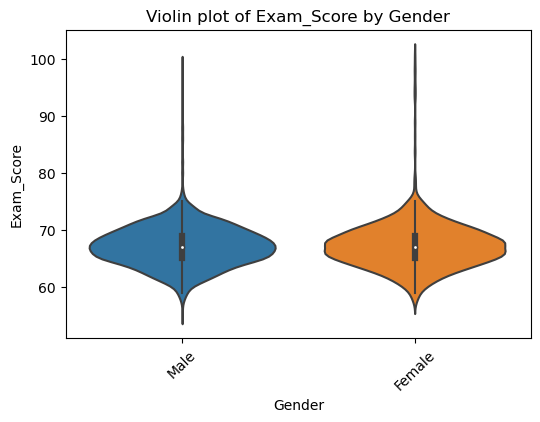

In [16]:

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(6,4))
        sns.violinplot(x=df[cat_col], y=df[num_col])
        plt.title(f"Violin plot of {num_col} by {cat_col}")
        plt.xticks(rotation=44)
        plt.show()

#### Bar plots for categorical and numerical comparisons

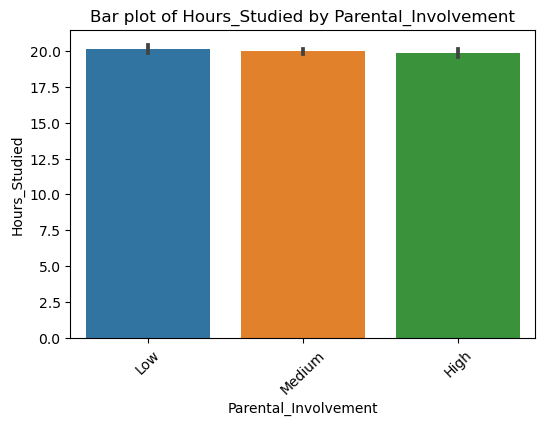

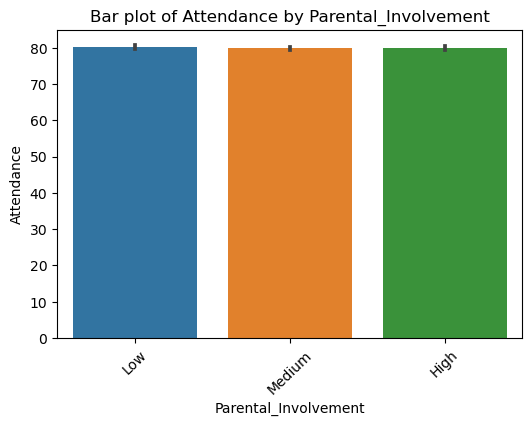

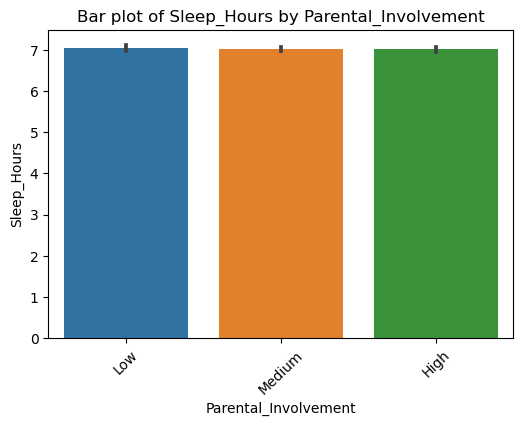

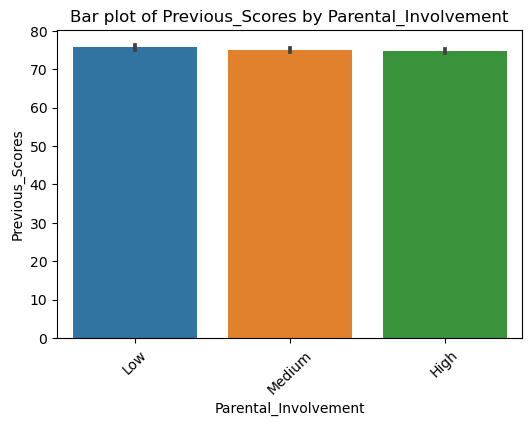

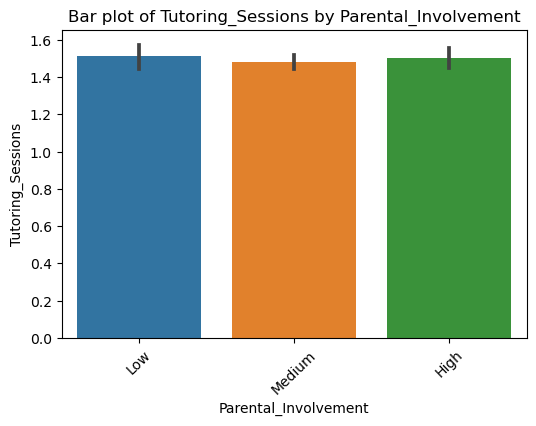

...

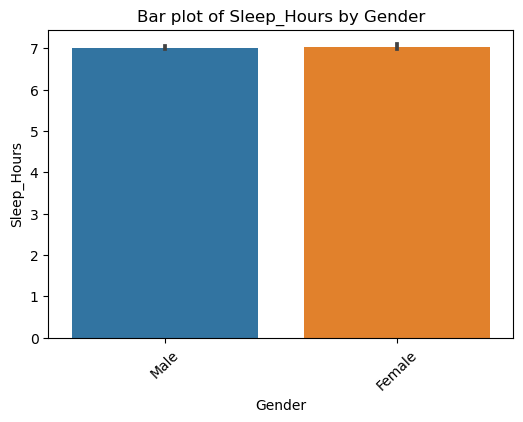

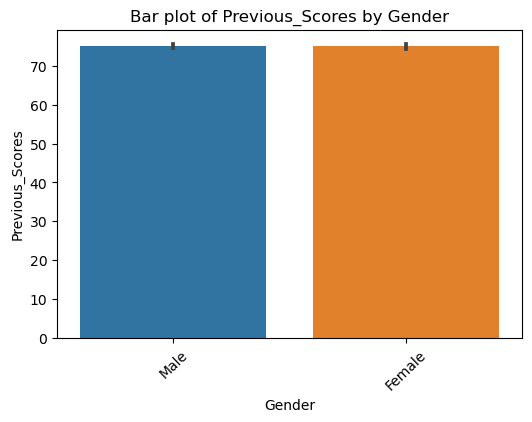

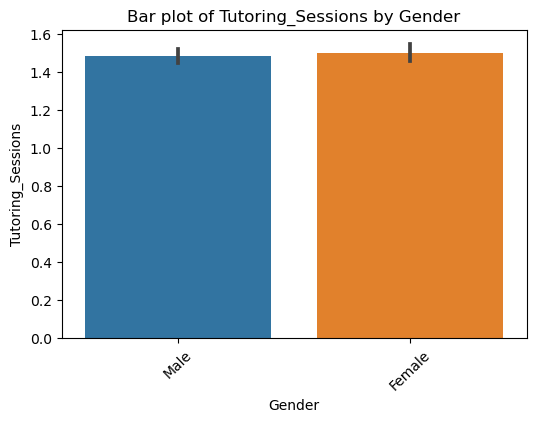

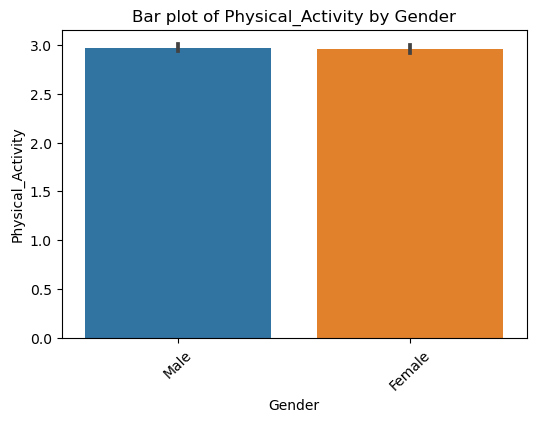

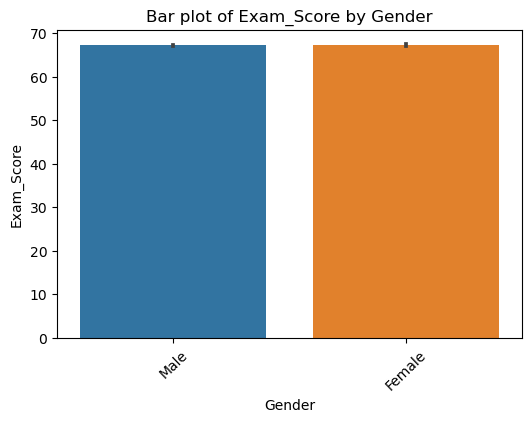

In [17]:

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(6,4))
        sns.barplot(x=df[cat_col], y=df[num_col], estimator=np.mean)
        plt.title(f"Bar plot of {num_col} by {cat_col}")
        plt.xticks(rotation=44)
        plt.show()

## Multivariate Analysis

#### Pair plots to analyze multiple relationships simultaneously

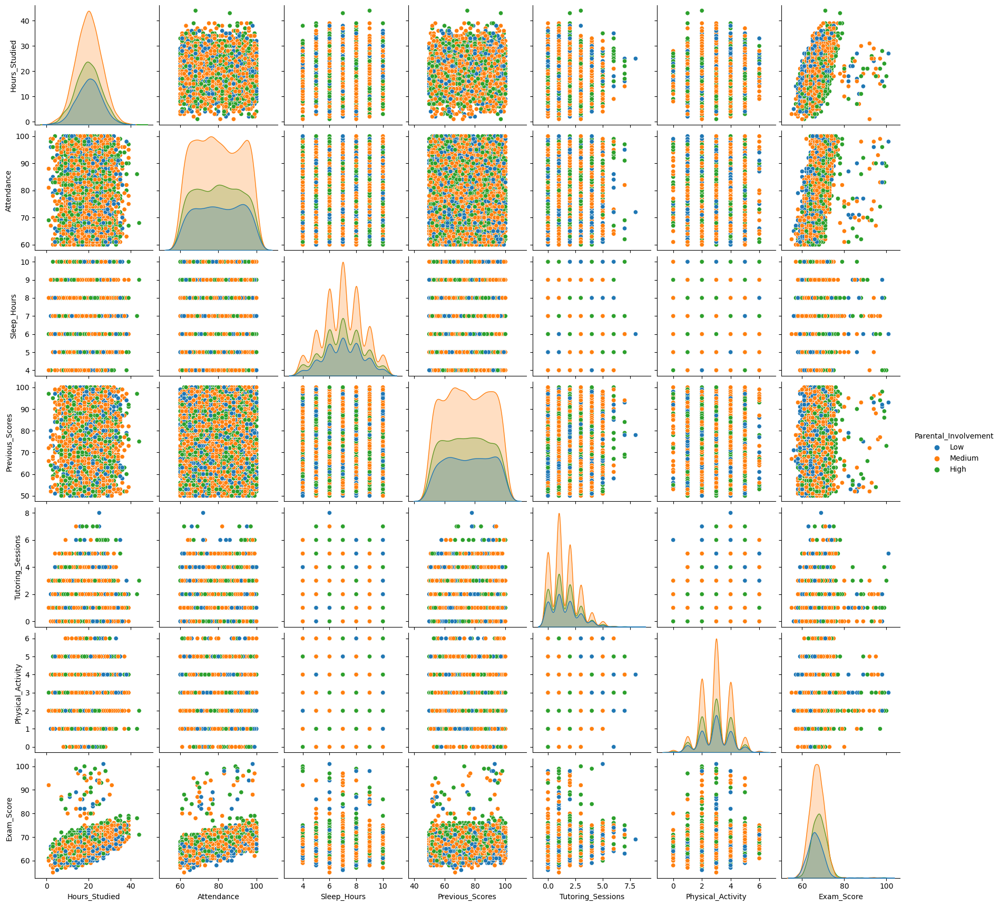

In [18]:
sns.pairplot(df, hue=categorical_columns[0] if len(categorical_columns) > 0 else None)
plt.show()


#### Heatmap to visualize correlations among multiple variables

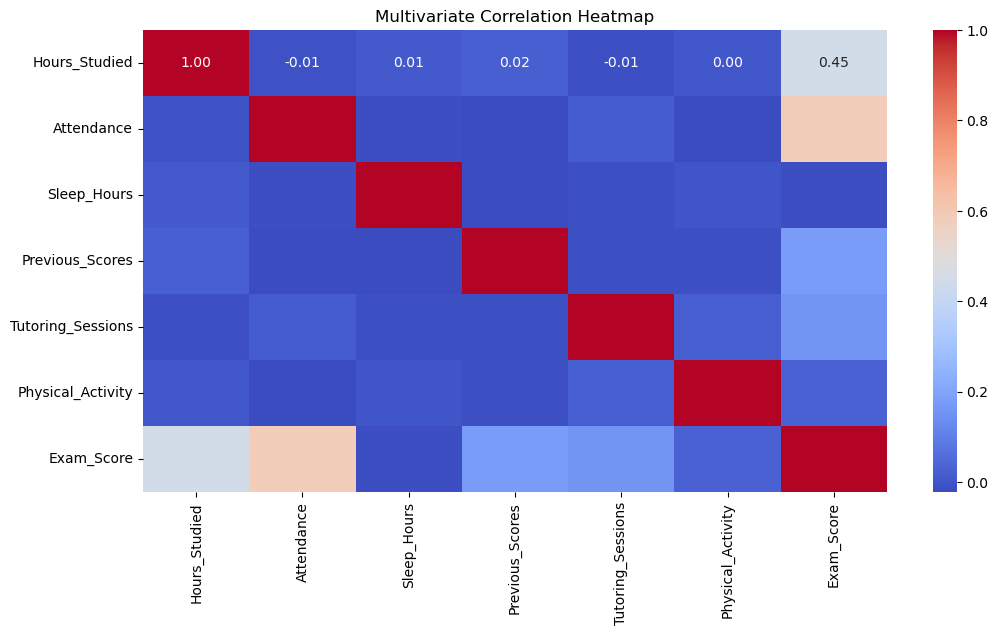

In [19]:

plt.figure(figsize=(12,6))
sns.heatmap(df[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Multivariate Correlation Heatmap")
plt.show()

#### Grouped comparisons to identify combined effects of multiple features

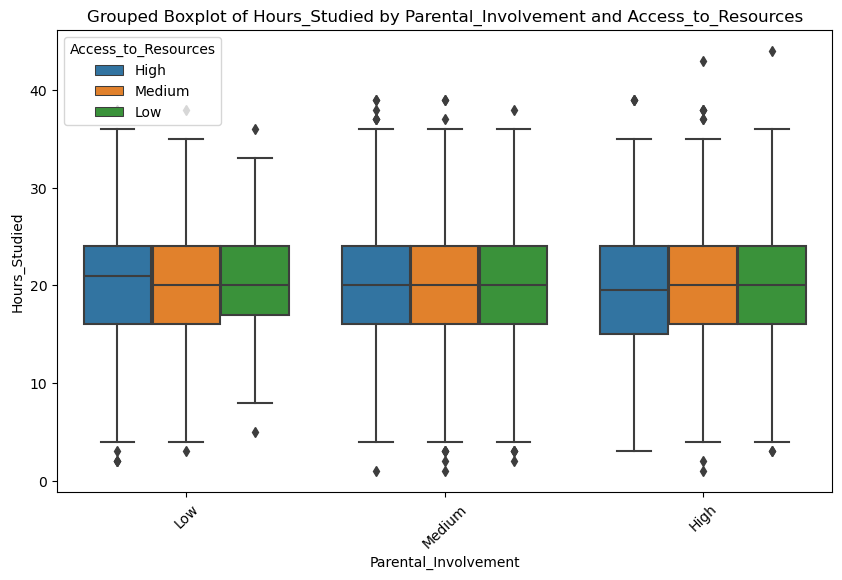

In [20]:

if len(categorical_columns) >= 2:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=df[categorical_columns[0]], y=df[numerical_columns[0]], hue=df[categorical_columns[1]])
    plt.title(f"Grouped Boxplot of {numerical_columns[0]} by {categorical_columns[0]} and {categorical_columns[1]}")
    plt.xticks(rotation=44)
    plt.show()

####  More Numerical features

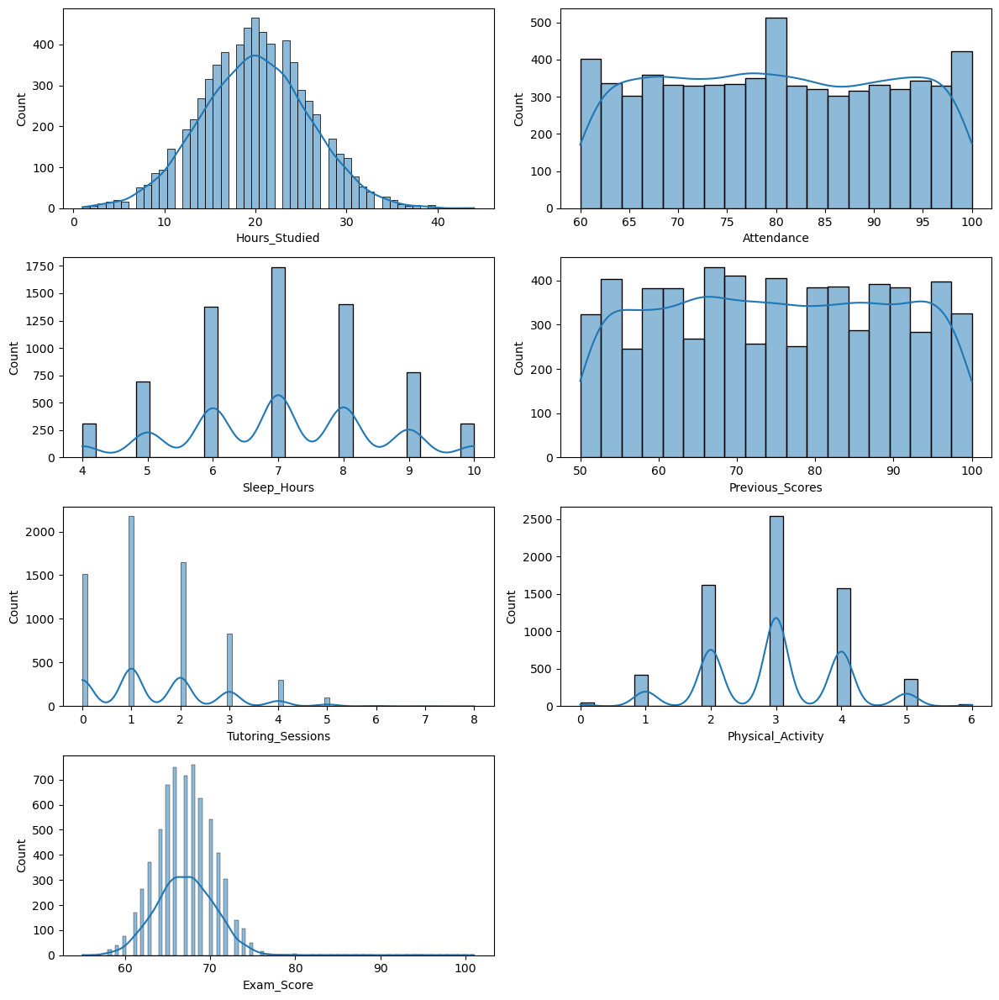

In [21]:
fig, axes = plt.subplots(4, 2, figsize=(12, 12))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(df[col], kde=True, ax=axes[i])
    plt.title(f'Distribution of {col}')

for j in range(len(num_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

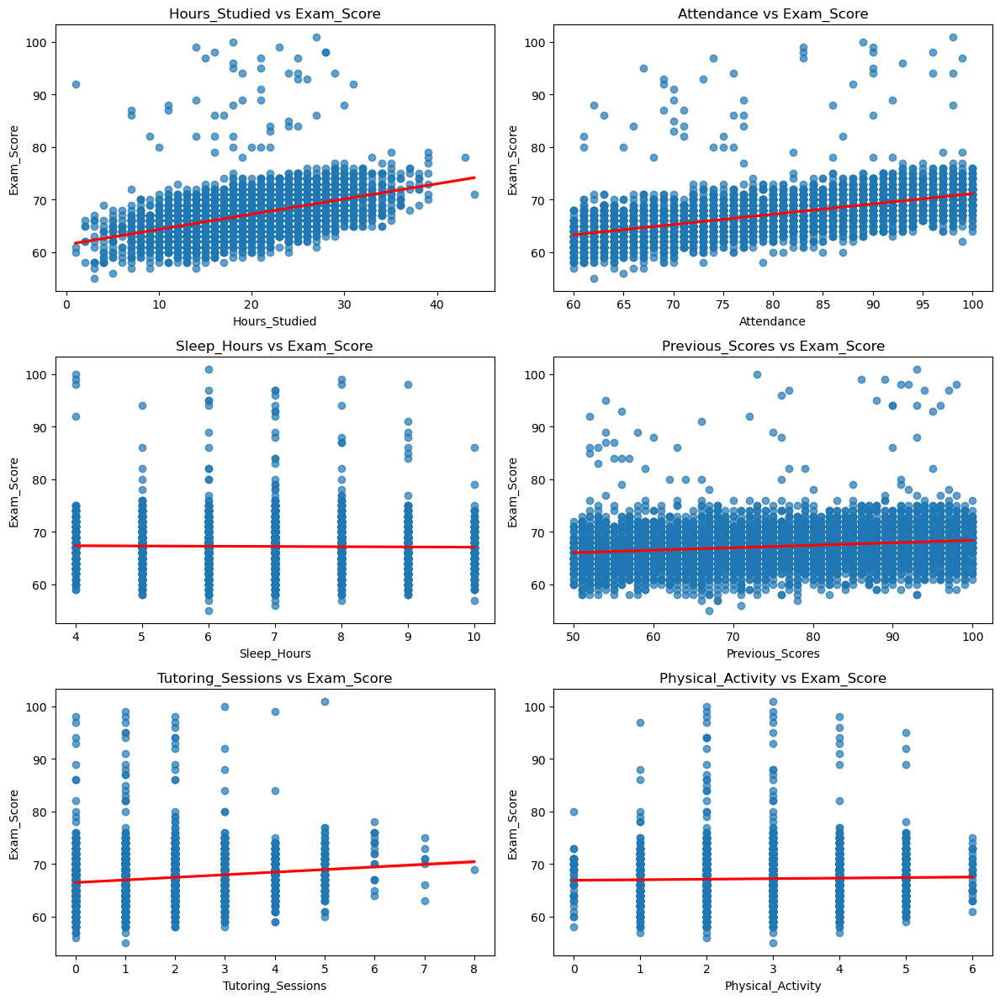

In [22]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    if col != 'Exam_Score':
        sns.regplot(x=col, y='Exam_Score', data=df, ax=axes[i], scatter_kws={'alpha': 0.7}, line_kws={'color': 'red'})
        axes[i].set_title(f'{col} vs Exam_Score')

plt.tight_layout()
plt.show()

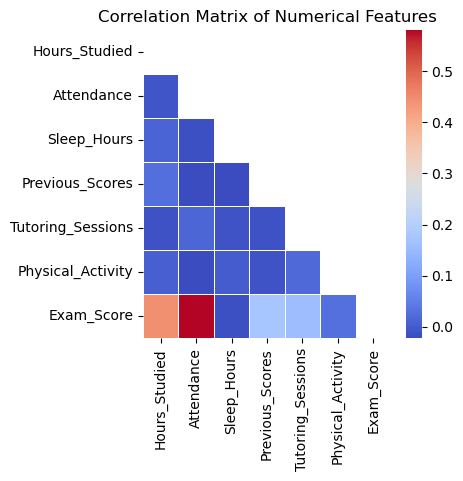

In [23]:
correlation_matrix = df[num_cols].corr()

plt.figure(figsize=(4, 4))
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap='coolwarm', 
    fmt='.2f', 
    linewidths=0.4, 
    mask=np.triu(np.ones_like(correlation_matrix, dtype=bool))
)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

In [24]:
exam_corr = df[num_cols].corr()['Exam_Score'].sort_values(ascending=False)
print('Correlation with Exam_Score:\n', exam_corr)

Correlation with Exam_Score:
 Exam_Score           1.000000
Attendance           0.581072
Hours_Studied        0.445455
Previous_Scores      0.175079
Tutoring_Sessions    0.156525
Physical_Activity    0.027824
Sleep_Hours         -0.017022
Name: Exam_Score, dtype: float64


#### More Categorical features-

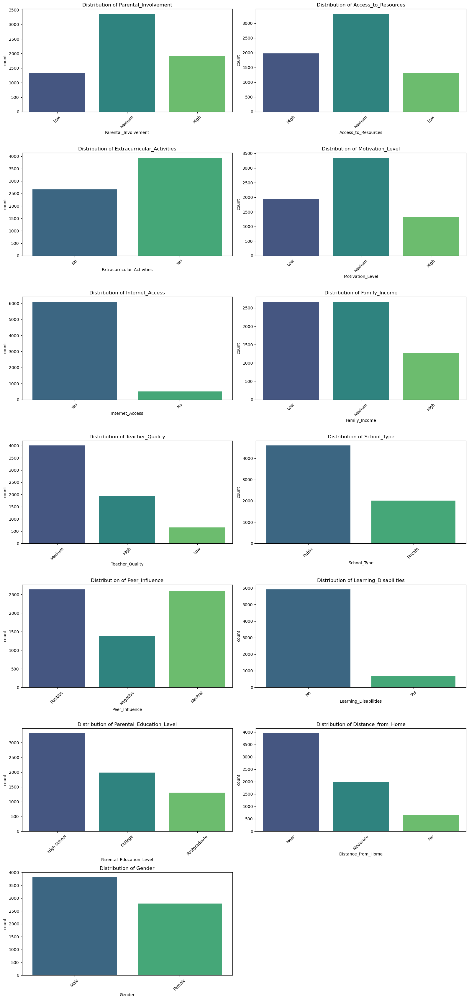

In [25]:
fig, axes = plt.subplots(7, 2, figsize=(16, 34))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.countplot(x=col, data=df, palette="viridis", ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].tick_params(axis='x', rotation=44)

for j in range(len(cat_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

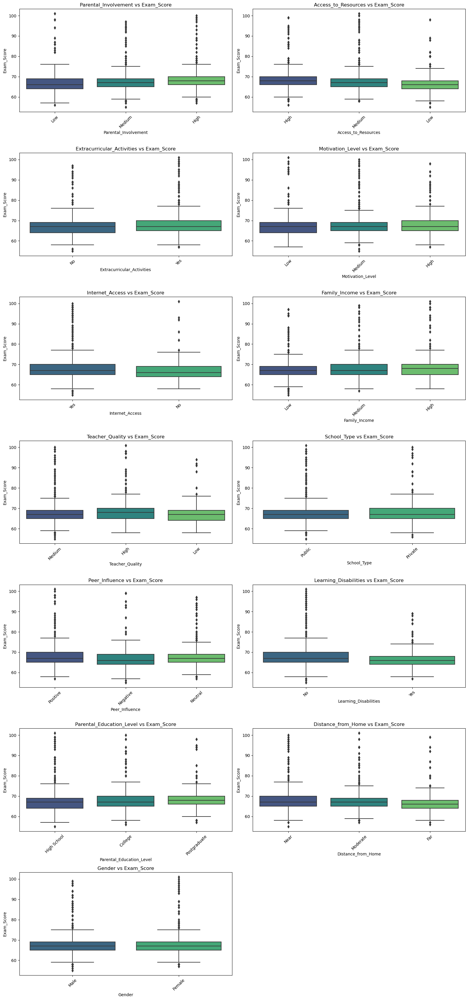

In [26]:
fig, axes = plt.subplots(7, 2, figsize=(16, 34))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.boxplot(x=col, y='Exam_Score', data=df, palette="viridis", ax=axes[i])
    axes[i].set_title(f'{col} vs Exam_Score')
    axes[i].tick_params(axis='x', rotation=44)

for j in range(len(cat_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## Comparisions of different factors with exam score


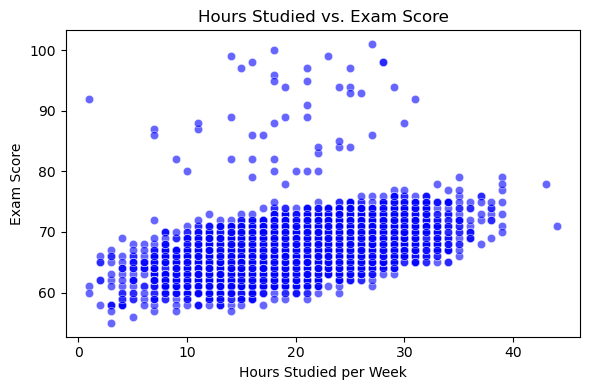

In [27]:
### Hours Studied vs. Exam Score
plt.figure(figsize=(6, 4))
sns.scatterplot(data=df, x="Hours_Studied", y="Exam_Score", alpha=0.6, color="blue")
plt.title("Hours Studied vs. Exam Score")
plt.xlabel("Hours Studied per Week")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


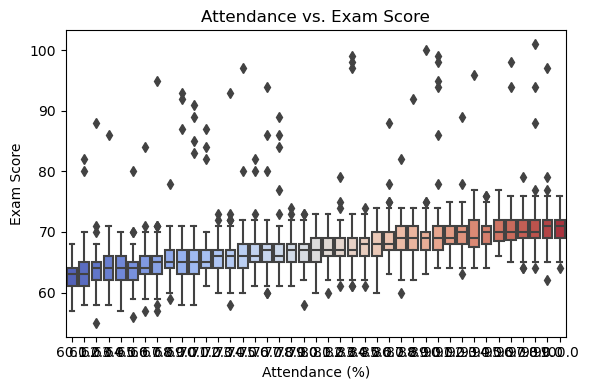

In [28]:


### Attendance vs. Exam Score
plt.figure(figsize=(6, 4))
sns.boxplot(data=df, x="Attendance", y="Exam_Score", palette="coolwarm")
plt.title("Attendance vs. Exam Score")
plt.xlabel("Attendance (%)")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


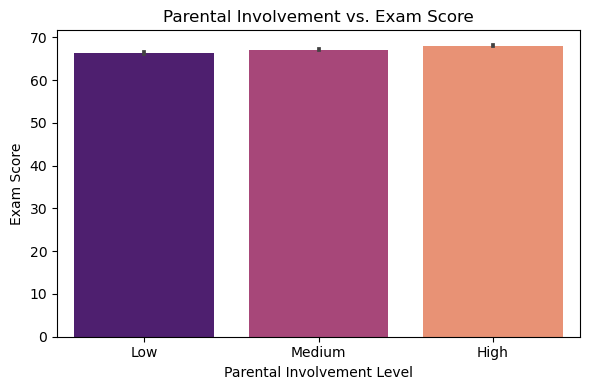

In [29]:


### Parental Involvement vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Parental_Involvement", y="Exam_Score", palette="magma")
plt.title("Parental Involvement vs. Exam Score")
plt.xlabel("Parental Involvement Level")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()

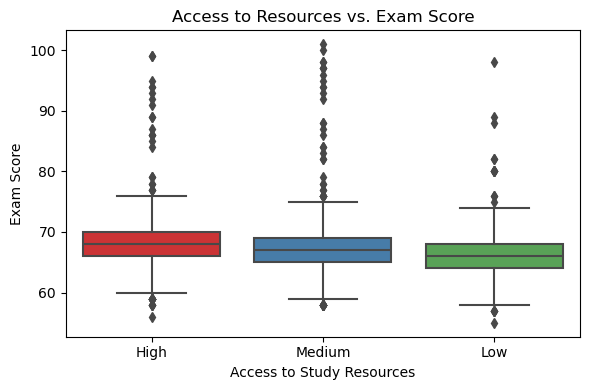

In [30]:
### Access to Resources vs. Exam Score
plt.figure(figsize=(6, 4))
sns.boxplot(data=df, x="Access_to_Resources", y="Exam_Score", palette="Set1")
plt.title("Access to Resources vs. Exam Score")
plt.xlabel("Access to Study Resources")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


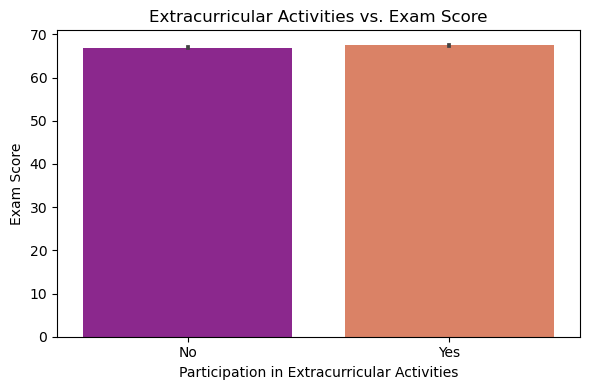

In [31]:
### Extracurricular Activities vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Extracurricular_Activities", y="Exam_Score", palette="plasma")
plt.title("Extracurricular Activities vs. Exam Score")
plt.xlabel("Participation in Extracurricular Activities")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


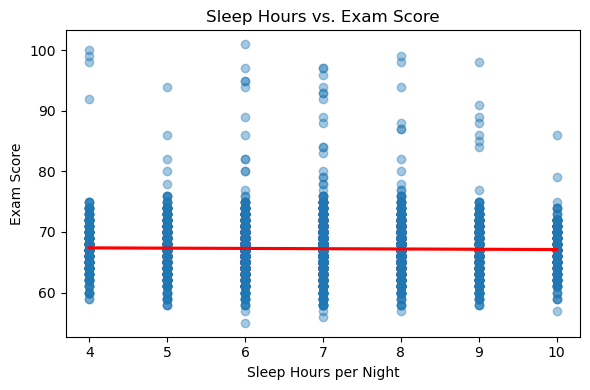

In [32]:

### Sleep Hours vs. Exam Score
plt.figure(figsize=(6, 4))
sns.regplot(data=df, x="Sleep_Hours", y="Exam_Score", scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'})
plt.title("Sleep Hours vs. Exam Score")
plt.xlabel("Sleep Hours per Night")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


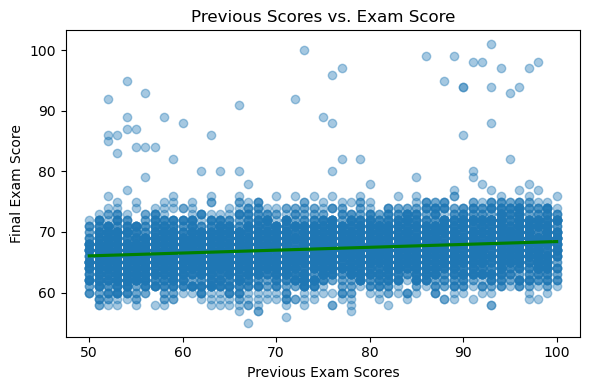

In [33]:
### Previous Scores vs. Exam Score
plt.figure(figsize=(6, 4))
sns.regplot(data=df, x="Previous_Scores", y="Exam_Score", scatter_kws={'alpha': 0.4}, line_kws={'color': 'green'})
plt.title("Previous Scores vs. Exam Score")
plt.xlabel("Previous Exam Scores")
plt.ylabel("Final Exam Score")
plt.tight_layout()
plt.show()

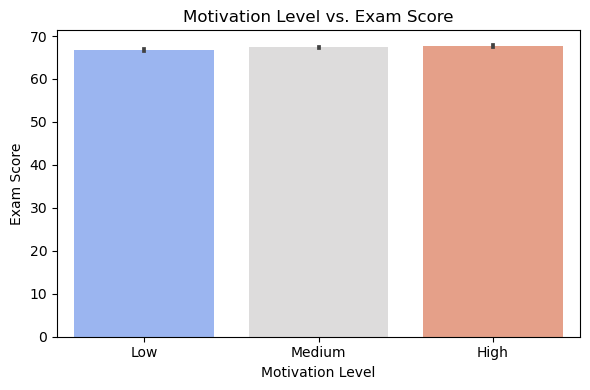

In [34]:
### Motivation Level vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Motivation_Level", y="Exam_Score", palette="coolwarm")
plt.title("Motivation Level vs. Exam Score")
plt.xlabel("Motivation Level")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


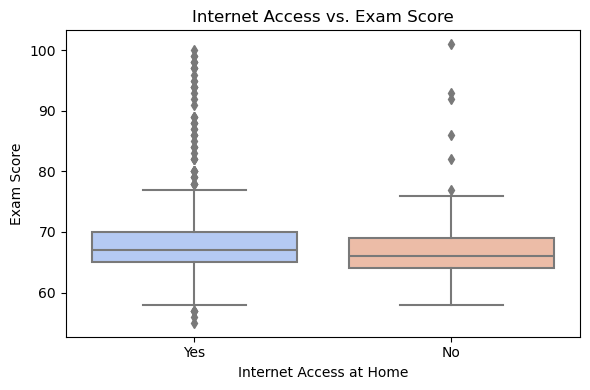

In [35]:
### Internet Access vs. Exam Score
plt.figure(figsize=(6, 4))
sns.boxplot(data=df, x="Internet_Access", y="Exam_Score", palette="coolwarm")
plt.title("Internet Access vs. Exam Score")
plt.xlabel("Internet Access at Home")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


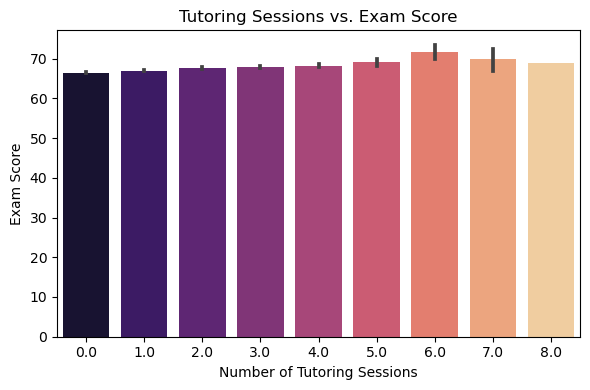

In [36]:
### Tutoring Sessions vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Tutoring_Sessions", y="Exam_Score", palette="magma")
plt.title("Tutoring Sessions vs. Exam Score")
plt.xlabel("Number of Tutoring Sessions")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()

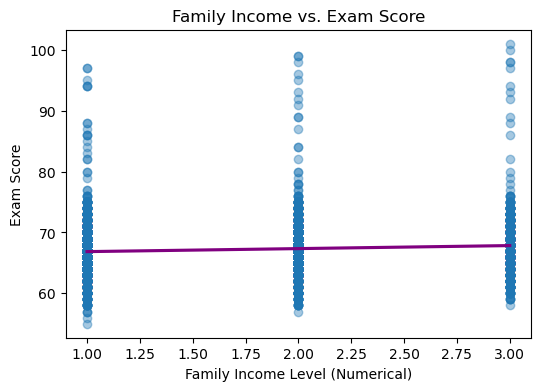

In [37]:
### Family Income vs. Exam Score
# Check if Family_Income is categorical
if df["Family_Income"].dtype == "object":
    income_mapping = {"Low": 1, "Medium": 2, "High": 3}  # Adjust based on dataset
    df["Family_Income"] = df["Family_Income"].map(income_mapping)
plt.figure(figsize=(6, 4))
sns.regplot(x=df["Family_Income"], y=df["Exam_Score"], scatter_kws={'alpha':0.4}, line_kws={'color':'purple'})
plt.title("Family Income vs. Exam Score")
plt.xlabel("Family Income Level (Numerical)")
plt.ylabel("Exam Score")
plt.show()


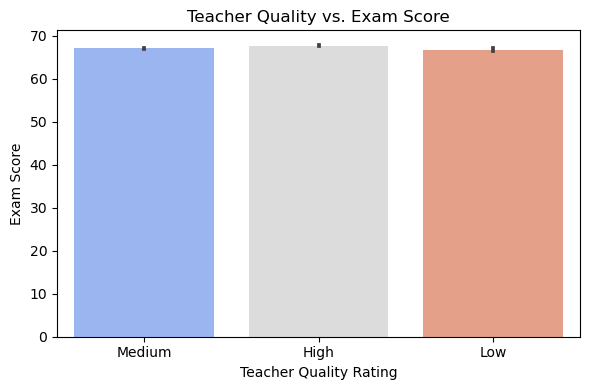

In [38]:
### Teacher Quality vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Teacher_Quality", y="Exam_Score", palette="coolwarm")
plt.title("Teacher Quality vs. Exam Score")
plt.xlabel("Teacher Quality Rating")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


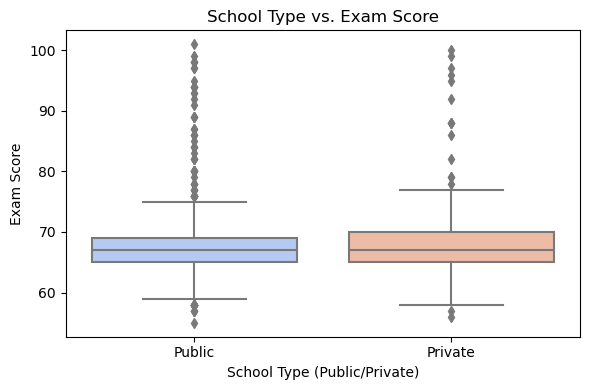

In [39]:
### School Type vs. Exam Score
plt.figure(figsize=(6, 4))
sns.boxplot(data=df, x="School_Type", y="Exam_Score", palette="coolwarm")
plt.title("School Type vs. Exam Score")
plt.xlabel("School Type (Public/Private)")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


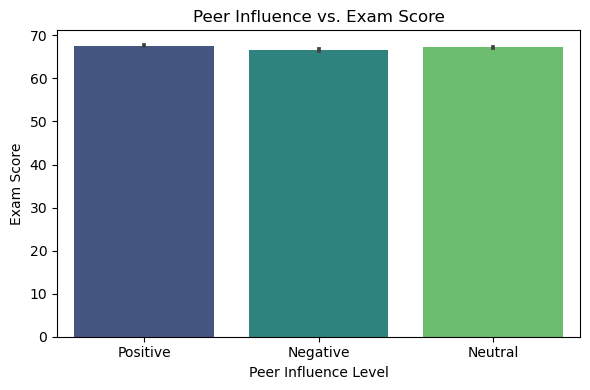

In [40]:
### Peer Influence vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Peer_Influence", y="Exam_Score", palette="viridis")
plt.title("Peer Influence vs. Exam Score")
plt.xlabel("Peer Influence Level")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()

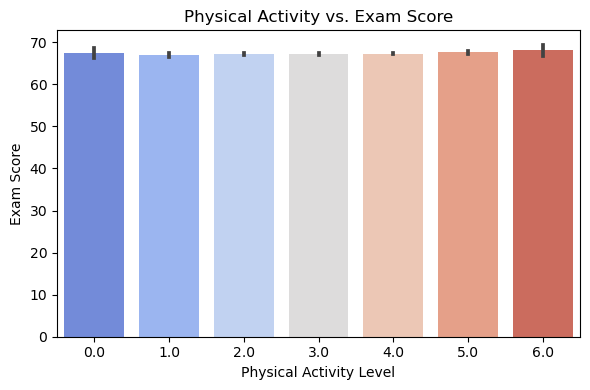

In [41]:
### Physical Activity vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Physical_Activity", y="Exam_Score", palette="coolwarm")
plt.title("Physical Activity vs. Exam Score")
plt.xlabel("Physical Activity Level")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()

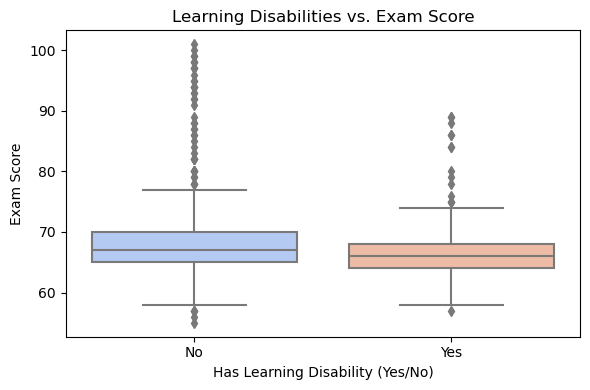

In [42]:
### Learning Disabilities vs. Exam Score
plt.figure(figsize=(6, 4))
sns.boxplot(data=df, x="Learning_Disabilities", y="Exam_Score", palette="coolwarm")
plt.title("Learning Disabilities vs. Exam Score")
plt.xlabel("Has Learning Disability (Yes/No)")
plt.ylabel("Exam Score")
plt.tight_layout()
plt.show()


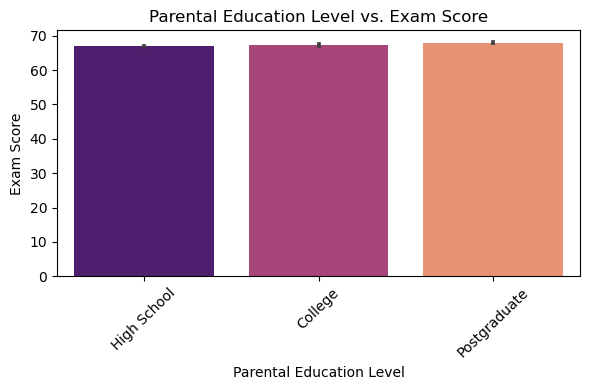

In [43]:
### Parental Education Level vs. Exam Score
plt.figure(figsize=(6, 4))
sns.barplot(data=df, x="Parental_Education_Level", y="Exam_Score", palette="magma")
plt.title("Parental Education Level vs. Exam Score")
plt.xlabel("Parental Education Level")
plt.ylabel("Exam Score")
plt.xticks(rotation=44)
plt.tight_layout()
plt.show()

##### Information drawn-

* Number of hours studied and attendance are clearly highly correlated with exam scores.

* Previous scores and number of tutoring sessions show somewhat of an impact on the final scores.

* Surprisingly, number of hours slept did not make any significant difference in exam scores. 

* As may be intuitively expected, higher parental involvement, access to resources, motivation level etc., led to higher exam scores.

* Public and private schools have very similar exam scores.

* Participating in extra-curricular activities also positively impacted scores. Students should get involved in non-academics too.

* Gender played no significant role in determining scores.

---

# Conclusions

1. Students need to improve primarily on their attendance and study hours in order to boost their exam scores.
2. Extracurricular activities should be promoted among students to help them engage more with their peers which should hopefully lead to lower stress levels and better grades.
3. The type of school (public vs. private) or gender does not play a significant role.


---
---